<p align="center">
  <br/>
    <a href="https://pdf-redaction.com/" target="_blank"><img alt="PDF Redaction"
    src="https://pdf-redaction.com/images/pdf-redaction-logo.svg" width="450" style="max-width: 100%;"></a>
  <br/>
</p>

<p align="center">
    <i>Secure Your PDFs with AI-powered Redaction</i>
</p>

<p align="center">
    <a target="_blank" href="https://colab.research.google.com/github/StabRise/pdf-redaction-api/blob/main/jupyter/PDF-Redaction-API-detect-pii-pdf.ipynb">
      <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
    </a>
    <a href="https://github.com/stabrise/spark-pdf/blob/main/LICENSE"><img alt="GitHub" src="https://img.shields.io/github/license/stabrise/spark-pdf.svg?color=blue"></a>
    <a href="https://stabrise.com"><img alt="StabRise" src="https://img.shields.io/badge/powered%20by-StabRise-orange.svg?style=flat&colorA=E1523D&colorB=blue"/>
    </a>
</p>

# Example of using PDF Redaction API: Detect PII (no redaction)

**Source**: [https://github.com/StabRise/pdf-redaction-api](https://github.com/StabRise/pdf-redaction-api)

[Swagger API documentation](https://api.pdf-redaction.com/api/docs)

Documentation: [https://pdf-redaction.com/docs/api/](https://pdf-redaction.com/docs/api/)

Self-Hosted PDF Redaction API: [https://pdf-redaction.com/docs/api-self-hosted/](https://pdf-redaction.com/docs/api-self-hosted/)

Web UI: [https://pdf-redaction.com](https://pdf-redaction.com)

For generate API Key please go to the: [https://pdf-redaction.com/apikeys/](https://pdf-redaction.com/apikeys/)

For check usage: [https://pdf-redaction.com/apikeys/usage/](https://pdf-redaction.com/apikeys/usage/)

Put API Key to the env variable `PDF_REDACTION_API_KEY` or to `.env` file.

This notebook demonstrates the `/detect/pii/pdf` endpoint, which detects PII entities in a PDF
(with bounding boxes and scores) **without redacting** the document. This is useful when you
want to review what would be detected before anonymizing, or build your own custom redaction logic.

## Limitations for free version
* 10 page per request
* 100 Free requests per month
* 5 requests per minute

## Installing dependencies for displaying PDF files

In [ ]:
%%bash
if [[ "$OSTYPE" == "linux-gnu"* ]]; then
    echo "Detected Linux. Installing poppler-utils..."
    apt-get install -y poppler-utils wget
elif [[ "$OSTYPE" == "darwin"* ]]; then
    echo "Detected macOS. Installing poppler..."
    brew install poppler wget
else
    echo "Unsupported OS: $OSTYPE"
fi

In [ ]:
# For Mac OS
!brew install poppler wget

In [ ]:
%pip install requests pdf2image pillow python-dotenv

## Downloading example PDF files

In [2]:
!wget https://raw.githubusercontent.com/StabRise/pdf-redaction-api/refs/heads/main/examples/pdfs/sample_document_en.pdf

--2026-08-16 16:56:22--  https://raw.githubusercontent.com/StabRise/pdf-redaction-api/refs/heads/main/examples/pdfs/sample_document_en.pdf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1112179 (1.1M) [application/octet-stream]
Saving to: ‘sample_document_en.pdf.2’

sample_document_en. 100%[===================>]   1.06M  5.65MB/s    in 0.2s    

2026-08-16 16:56:23 (5.65 MB/s) - ‘sample_document_en.pdf.2’ saved [1112179/1112179]



# Display original PDF

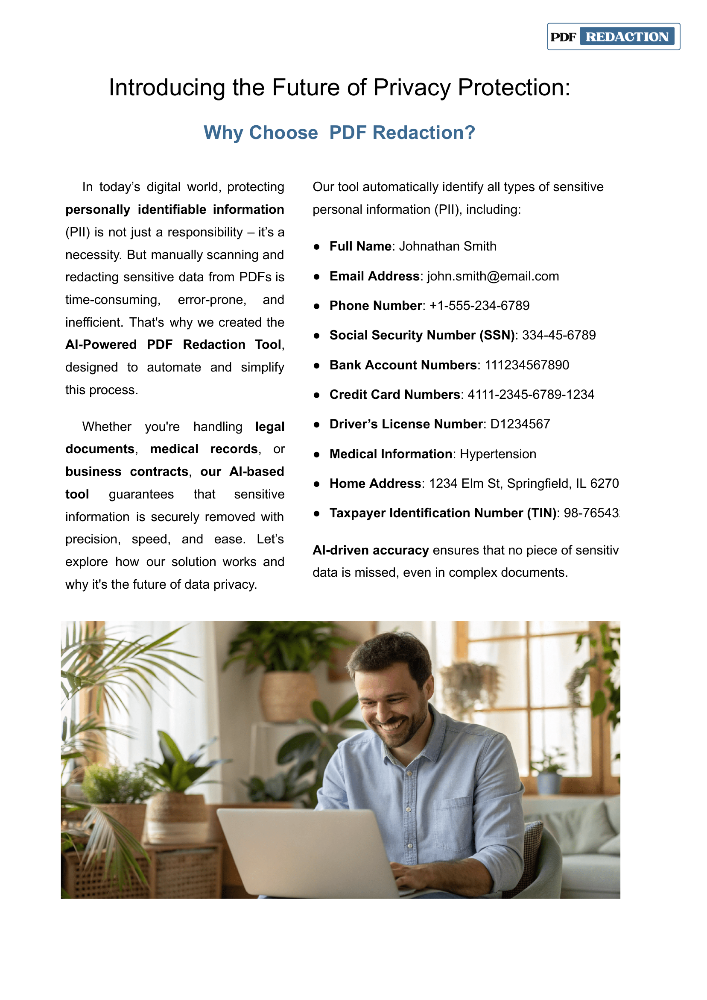

In [1]:
from pdf2image import convert_from_path
from IPython.display import display

# File path to your PDF (replace with your actual file path)
file_path = "./sample_document_en.pdf"
# or use local file from example folder
#file_path = "../examples/pdfs/sample_document_en.pdf"

def display_pdf(pdf_path, dpi=200):
    """Display first page of the pdf file"""
    # Convert first page of PDF to image
    pages = convert_from_path(pdf_path, first_page=1, last_page=1, dpi=dpi)  # returns a list of PIL Images

    # Display first page
    display(pages[0])

display_pdf(file_path)

# Detect PII in PDF using API (no redaction)

In [3]:
import requests
from pathlib import Path
import base64
import json
import os
from dotenv import load_dotenv

load_dotenv()

pdf_redaction_api_base_url = os.environ.get(
    "PDF_REDACTION_API_BASE_URL",
    "https://api.pdf-redaction.com/api")

pdf_redaction_api_key = os.environ.get("PDF_REDACTION_API_KEY")

# Assemble full URL
pdf_redaction_api_url = f"{pdf_redaction_api_base_url}/detect/pii/pdf"

# Define the tags to detect, if not specified all tags will be detected
tags = [
    "DATE",
    "PERSON_NAME",
    "ORGANIZATION",
    "LOCATION",
    "EMAIL",
    "PHONE",
    "ID",
    "ACCOUNT",
    "ZIP_CODE",
    "ADDRESS",
    "IP",
    "URL",
    "SSN",
    "DRIVER_LICENSE",
    "PASSPORT",
    "AGE",
    "CREDIT_CARD",
    "MONEY_AMOUNT",
    "FACE"
]

headers = {
    "accept": "application/json",
    "X-API-Key": pdf_redaction_api_key,
}

# Read the PDF file and send it to the API
with open(file_path, "rb") as f:
    pdf_decoded = base64.b64encode(f.read()).decode("utf-8")
    response = requests.post(pdf_redaction_api_url,
                             headers=headers,
                             json={
                                 "pdf": pdf_decoded,
                                 "tags": tags,
                                 "rotated_text": True,
                                 "force_ocr": True,
                                 "ocr_langs": ["eng"]
                             })

print("Status code:", response.status_code)

if response.status_code == 200:
    result = response.json()
else:
    print("Error:", response.json())

Status code: 200


## Display processing time

In [4]:
print(json.dumps(result["processing_time"], indent=4))

{
    "total": 5.6096,
    "stages": {
        "PdfDataToSingleImage": 0.7538,
        "DBNetOnnxDetector": 0.7418,
        "TextRecognizer": 0.6123,
        "Ocr": 1.8256,
        "FaceDetector": 0.3304,
        "Ner": 1.3441
    }
}


## Display detected PII

In [5]:
print(json.dumps(result["detected_pii"], indent=4))

[
    {
        "path": "memory",
        "entities": [
            {
                "entity_group": "ID",
                "score": 0.0,
                "word": "98-76543",
                "start": 0,
                "end": 0,
                "boxes": [
                    {
                        "text": "98-76543",
                        "score": 0.8844512939453125,
                        "x": 1983,
                        "y": 1783,
                        "width": 190,
                        "height": 34,
                        "angle": 0.0
                    }
                ]
            },
            {
                "entity_group": "PERSON_NAME",
                "score": 0.0,
                "word": "Johnathan Smith",
                "start": 0,
                "end": 0,
                "boxes": [
                    {
                        "text": "Johnathan",
                        "score": 0.9531246948242188,
                        "x": 1403,
                  

## Summarize detected PII entities

Group and count the detected entities by tag (`entity_group`) across all pages.

In [6]:
from collections import Counter

entity_counter = Counter()

for page in result["detected_pii"]:
    for entity in page.get("entities", []):
        entity_counter[entity["entity_group"]] += 1

for entity_group, count in entity_counter.most_common():
    print(f"{entity_group}: {count}")

ID: 1
PERSON_NAME: 1
EMAIL: 1
PHONE: 1
SSN: 1
ACCOUNT: 1
CREDIT_CARD: 1
DRIVER_LICENSE: 1
ADDRESS: 1
FACE: 1
URL: 1


## Visualize detected PII bounding boxes on the PDF page

Draw the bounding boxes of the detected entities on top of the original PDF page image,
without modifying/redacting the source document.

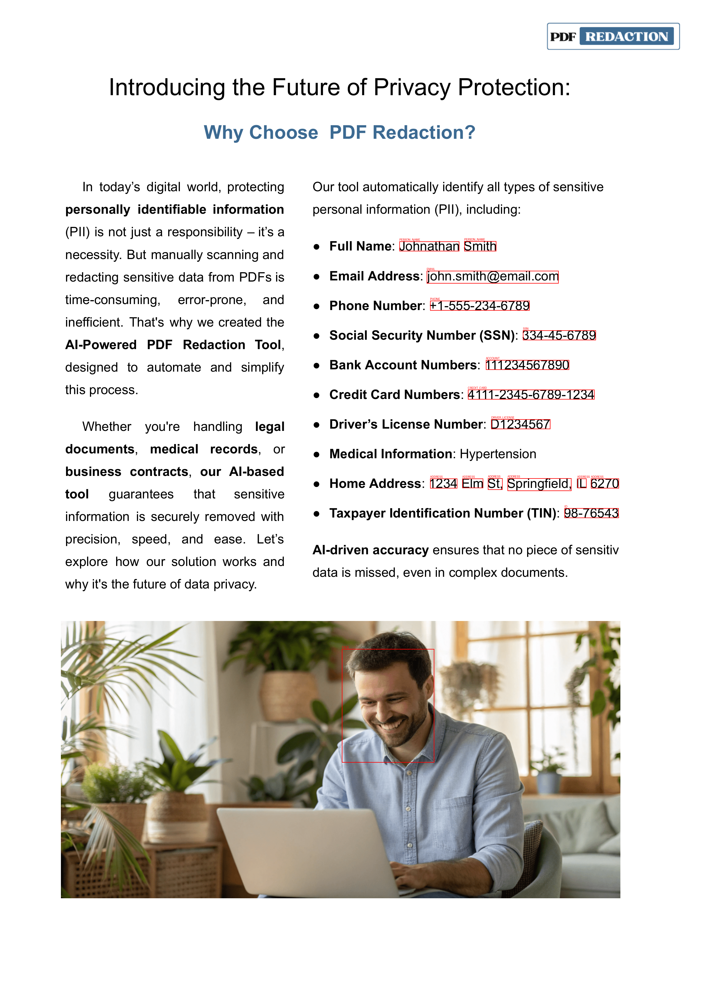

In [7]:
from PIL import ImageDraw

def draw_detected_pii(pdf_path, detected_pii, page_number=1, dpi=300):
    """Draw bounding boxes of detected PII entities on top of the given PDF page."""
    pages = convert_from_path(pdf_path, first_page=page_number, last_page=page_number, dpi=dpi)
    image = pages[0].convert("RGB")
    draw = ImageDraw.Draw(image)

    page_result = detected_pii[page_number - 1]
    for entity in page_result.get("entities", []):
        for box in entity.get("boxes", []):
            x, y, w, h = box["x"], box["y"], box["width"], box["height"]
            draw.rectangle([x, y, x + w, y + h], outline="red", width=2)
            draw.text((x, max(y - 12, 0)), entity["entity_group"], fill="red")

    display(image)

draw_detected_pii(file_path, result["detected_pii"], page_number=1)